## Importing libraries and data

In [182]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [102]:
path = r'C:\Users\asicz\OneDrive\Dokumenty\CareerFoundry_Data_Analyst_Course\Machine Learning with Python\Data Sets\Unsupervised'

In [137]:
df = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed_cleaned.csv'))
df_test = pd.read_csv(os.path.join(path,'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))

In [139]:
df

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
0,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9,1,...,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,8,1.0304,0.98
1,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1,6,...,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,6,1.0292,0.62
2,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9,6,...,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,8,1.0320,0.69
3,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6,8,...,1.0184,0.13,0.98,0.0,7.4,7.3,10.6,6,1.0443,0.98
4,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,1.0328,0.46,0.00,5.7,5.7,3.0,8.4,7,1.0430,0.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4,2,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,4,1.0263,0.98
22946,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9,0,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,3,1.0263,1.00
22947,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4,2,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,3,1.0263,0.85
22948,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1,1,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,3,1.0263,0.94


In [141]:
df_test

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Preparing the data

In [144]:
# Add DATE column to the cleaned data set
df.insert(0, 'DATE', df_test['DATE'])
df

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
0,19600101,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9,...,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,8,1.0304,0.98
1,19600102,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1,...,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,6,1.0292,0.62
2,19600103,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9,...,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,8,1.0320,0.69
3,19600104,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6,...,1.0184,0.13,0.98,0.0,7.4,7.3,10.6,6,1.0443,0.98
4,19600105,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0,...,1.0328,0.46,0.00,5.7,5.7,3.0,8.4,7,1.0430,0.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,4,1.0263,0.98
22946,20221028,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,3,1.0263,1.00
22947,20221029,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,3,1.0263,0.85
22948,20221030,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1,...,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,3,1.0263,0.94


In [146]:
# Reduce the dataset to a decade
df['DATE'] = pd.to_datetime(df['DATE'].astype(str), format='%Y%m%d')
df_decade = df[(df['DATE'] >= '2000-01-01') & (df['DATE'] <= '2009-12-31')]
df_test['DATE'] = pd.to_datetime(df_test['DATE'].astype(str), format='%Y%m%d')
df_test_decade = df_test[(df_test['DATE'] >= '2000-01-01') & (df_test['DATE'] <= '2009-12-31')]

In [148]:
df_decade

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
14610,2000-01-01,8,0.89,1.0286,0.20,0.03,0.0,2.9,1.6,3.9,...,1.0235,0.22,0.10,0.7,6.6,2.1,11.0,6,1.0420,0.94
14611,2000-01-02,8,0.87,1.0318,0.25,0.00,0.0,3.6,2.7,4.8,...,1.0177,0.13,0.42,0.0,9.6,7.3,10.6,6,1.0467,0.94
14612,2000-01-03,5,0.81,1.0314,0.50,0.00,3.7,2.2,0.1,4.8,...,1.0154,0.22,1.05,1.2,8.6,7.3,9.9,6,1.0465,0.88
14613,2000-01-04,7,0.79,1.0262,0.63,0.35,6.9,3.9,0.5,7.5,...,1.0099,0.36,0.34,3.5,8.1,5.0,7.7,2,1.0364,0.58
14614,2000-01-05,5,0.90,1.0246,0.51,0.07,3.7,6.0,3.8,8.6,...,0.9957,0.12,0.33,0.0,7.7,4.0,11.3,4,1.0378,0.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,2009-12-27,7,0.80,1.0118,0.37,0.18,2.3,1.0,-3.9,5.5,...,1.0039,0.37,0.01,4.7,7.2,5.8,8.5,6,1.0237,0.88
18259,2009-12-28,7,0.82,1.0084,0.28,0.42,0.3,3.2,1.0,4.8,...,0.9975,0.22,1.25,0.0,4.8,1.4,8.3,7,1.0258,0.88
18260,2009-12-29,7,0.92,1.0028,0.22,1.68,0.2,4.5,2.4,10.0,...,0.9866,0.12,2.84,0.0,3.4,2.6,4.2,8,1.0230,0.88
18261,2009-12-30,8,0.92,0.9979,0.18,1.54,0.0,8.5,7.5,11.5,...,0.9862,0.12,1.46,0.0,3.1,2.1,4.2,8,1.0126,0.85


In [150]:
df_test_decade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
14610,2000-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14611,2000-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14612,2000-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14613,2000-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14614,2000-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,2009-12-27,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18259,2009-12-28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18260,2009-12-29,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18261,2009-12-30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [152]:
# Check the dates range
print(df_decade['DATE'].min(), df_decade['DATE'].max())
print(df_test_decade['DATE'].min(), df_test_decade['DATE'].max())

2000-01-01 00:00:00 2009-12-31 00:00:00
2000-01-01 00:00:00 2009-12-31 00:00:00


In [154]:
# Drop the date columns
df_decade = df_decade.drop(columns=['DATE'], errors='ignore')
df_test_decade = df_test_decade.drop(columns=['DATE'], errors='ignore')

In [156]:
df_decade

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
14610,8,0.89,1.0286,0.20,0.03,0.0,2.9,1.6,3.9,7,...,1.0235,0.22,0.10,0.7,6.6,2.1,11.0,6,1.0420,0.94
14611,8,0.87,1.0318,0.25,0.00,0.0,3.6,2.7,4.8,8,...,1.0177,0.13,0.42,0.0,9.6,7.3,10.6,6,1.0467,0.94
14612,5,0.81,1.0314,0.50,0.00,3.7,2.2,0.1,4.8,5,...,1.0154,0.22,1.05,1.2,8.6,7.3,9.9,6,1.0465,0.88
14613,7,0.79,1.0262,0.63,0.35,6.9,3.9,0.5,7.5,7,...,1.0099,0.36,0.34,3.5,8.1,5.0,7.7,2,1.0364,0.58
14614,5,0.90,1.0246,0.51,0.07,3.7,6.0,3.8,8.6,7,...,0.9957,0.12,0.33,0.0,7.7,4.0,11.3,4,1.0378,0.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,7,0.80,1.0118,0.37,0.18,2.3,1.0,-3.9,5.5,8,...,1.0039,0.37,0.01,4.7,7.2,5.8,8.5,6,1.0237,0.88
18259,7,0.82,1.0084,0.28,0.42,0.3,3.2,1.0,4.8,4,...,0.9975,0.22,1.25,0.0,4.8,1.4,8.3,7,1.0258,0.88
18260,7,0.92,1.0028,0.22,1.68,0.2,4.5,2.4,10.0,6,...,0.9866,0.12,2.84,0.0,3.4,2.6,4.2,8,1.0230,0.88
18261,8,0.92,0.9979,0.18,1.54,0.0,8.5,7.5,11.5,6,...,0.9862,0.12,1.46,0.0,3.1,2.1,4.2,8,1.0126,0.85


In [158]:
df_test_decade

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
14610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14611,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14612,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14613,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14614,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18259,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18261,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Create Random Forest model

In [184]:
X = df_decade
y = df_test_decade

In [186]:
# Reshape the data
X = np.array(X)  
y = np.array(y) 
#y = y.max(axis=1) # picks the maximum value across all stations (one-hot encoded classification) and doesn't make sense for multi-labels data

In [188]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [190]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739, 15)
(914, 135) (914, 15)


In [192]:
# Train Random Forest with Multi-label Output
rf = RandomForestClassifier(n_estimators=100) # 100 trees
clf = MultiOutputClassifier(rf)
clf.fit(X_train, y_train)

MultiOutputClassifier(estimator=RandomForestClassifier())

In [194]:
y_pred = clf.predict(X_test)

# Exact match ratio from all the stations
exact_match_accuracy = np.mean(np.all(y_pred == y_test, axis=1))
print(f"Exact match accuracy: {exact_match_accuracy:.3f}")

Exact match accuracy: 0.830


In [224]:
# Get the station names
station_names = [col.replace('_pleasant_weather', '') for col in df_test_decade.columns]

for i, name in enumerate(station_names):
    print(f"Index {i}: {name}")

Index 0: BASEL
Index 1: BELGRADE
Index 2: BUDAPEST
Index 3: DEBILT
Index 4: DUSSELDORF
Index 5: HEATHROW
Index 6: KASSEL
Index 7: LJUBLJANA
Index 8: MAASTRICHT
Index 9: MADRID
Index 10: MUNCHENB
Index 11: OSLO
Index 12: SONNBLICK
Index 13: STOCKHOLM
Index 14: VALENTIA


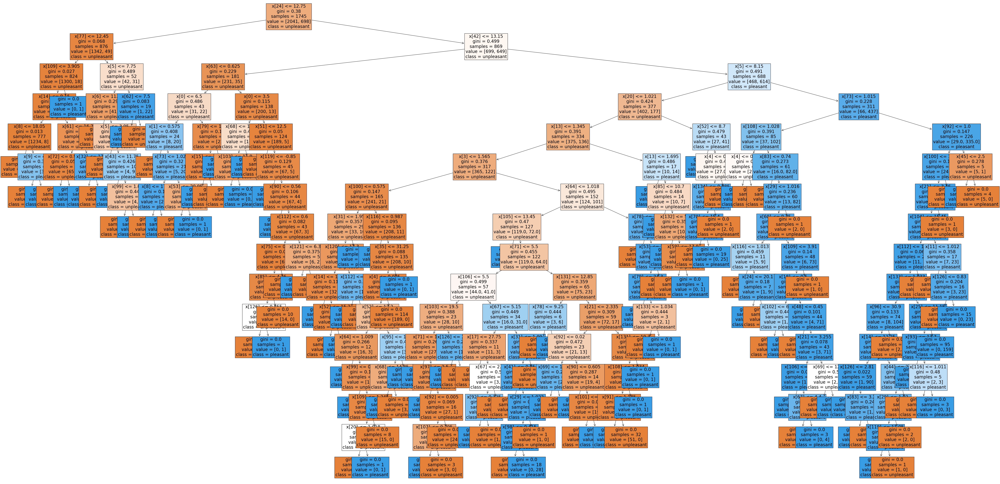

In [216]:
fig = plt.figure(figsize=(80, 40))

# clf.estimators_[0] is the RF model for first output (e.g., BASEL)
# Select the first tree inside that forest:
tree = clf.estimators_[0].estimators_[0]

plot_tree(tree, fontsize=20, class_names=['unpleasant', 'pleasant'], filled=True)

plt.show()

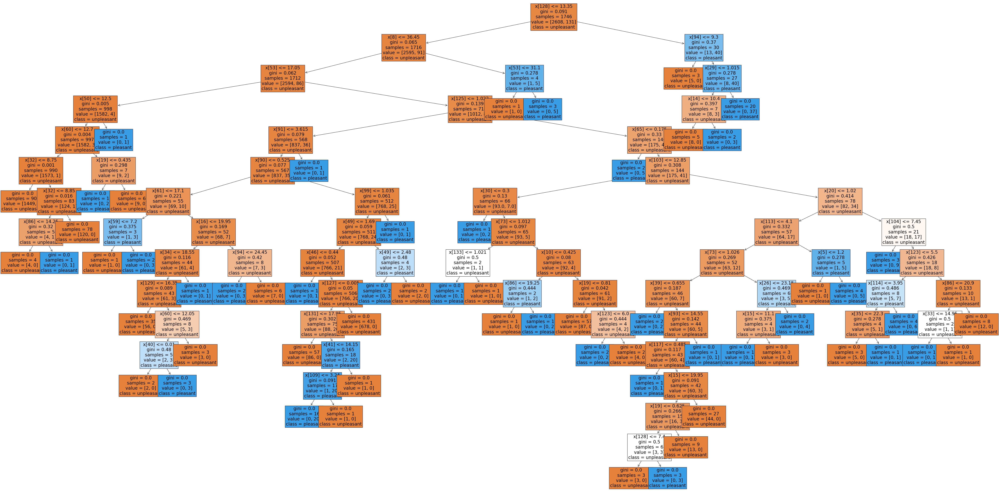

In [222]:
fig = plt.figure(figsize=(80, 40))

# Select the tree inside the forest:
tree = clf.estimators_[14].estimators_[99]

plot_tree(tree, fontsize=20, class_names=['unpleasant', 'pleasant'], filled=True)

plt.show()

In [196]:
# Get the feature importances for each output model
importances = np.array([est.feature_importances_ for est in clf.estimators_])
# Reshape to (-1, 15, 9) — 15 models × 15 stations × 9 features
important = importances.reshape(-1, 15, 9)
station_importance = np.sum(important[0], axis=1)

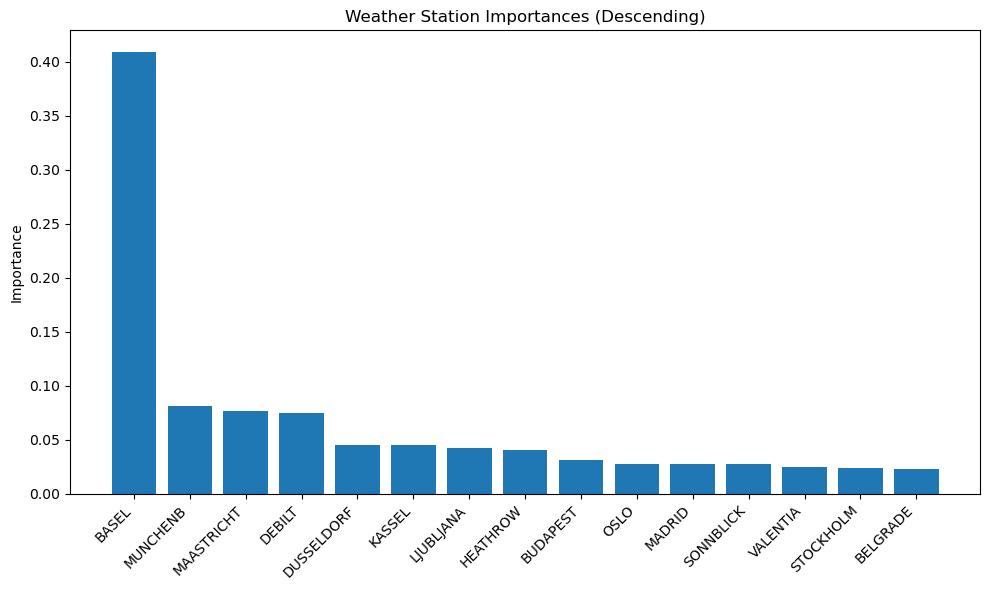

In [202]:
station_names = [col.replace('_pleasant_weather', '') for col in df_test_decade.columns]

# Sort by importance
sorted_indices = np.argsort(station_importance)[::-1]  # descending
sorted_importance = station_importance[sorted_indices]
sorted_names = np.array(station_names)[sorted_indices]

plt.figure(figsize=(10, 6))
plt.bar(sorted_names, sorted_importance)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Importance')
plt.title('Weather Station Importances (Descending)')
plt.tight_layout()
plt.show()

## Basel RF

In [349]:
df = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed_cleaned.csv'))

In [350]:
# Create a subset of the full data with observations only from Basel station
basel = df[[col for col in df.columns if 'BASEL_' in col]]

In [353]:
basel

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9
1,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1
2,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9
3,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6
4,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0
...,...,...,...,...,...,...,...,...,...
22945,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4
22946,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9
22947,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4
22948,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1


In [355]:
y = df_test.drop(columns=['DATE'], errors='ignore')
y = np.array(y) 
y = y.max(axis=1)

In [433]:
X = np.array(basel)

In [435]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [437]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [441]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5)

In [443]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.896131056117114


[Text(0.5, 0.9166666666666666, 'x[6] <= 8.85\ngini = 0.48\nsamples = 10877\nvalue = [6871, 10341]\nclass = pleasant'),
 Text(0.25, 0.75, 'x[6] <= 4.85\ngini = 0.261\nsamples = 4643\nvalue = [6263, 1143]\nclass = unpleasant'),
 Text(0.125, 0.5833333333333334, 'x[3] <= 1.355\ngini = 0.086\nsamples = 2802\nvalue = [4286, 201]\nclass = unpleasant'),
 Text(0.0625, 0.4166666666666667, 'x[8] <= 6.35\ngini = 0.063\nsamples = 2608\nvalue = [4048, 136]\nclass = unpleasant'),
 Text(0.03125, 0.25, 'x[4] <= 0.425\ngini = 0.032\nsamples = 1982\nvalue = [3117, 51]\nclass = unpleasant'),
 Text(0.015625, 0.08333333333333333, 'gini = 0.024\nsamples = 1784\nvalue = [2804, 35]\nclass = unpleasant'),
 Text(0.046875, 0.08333333333333333, 'gini = 0.093\nsamples = 198\nvalue = [313, 16]\nclass = unpleasant'),
 Text(0.09375, 0.25, 'x[6] <= 2.85\ngini = 0.153\nsamples = 626\nvalue = [931, 85]\nclass = unpleasant'),
 Text(0.078125, 0.08333333333333333, 'gini = 0.035\nsamples = 135\nvalue = [221, 4]\nclass = unpl

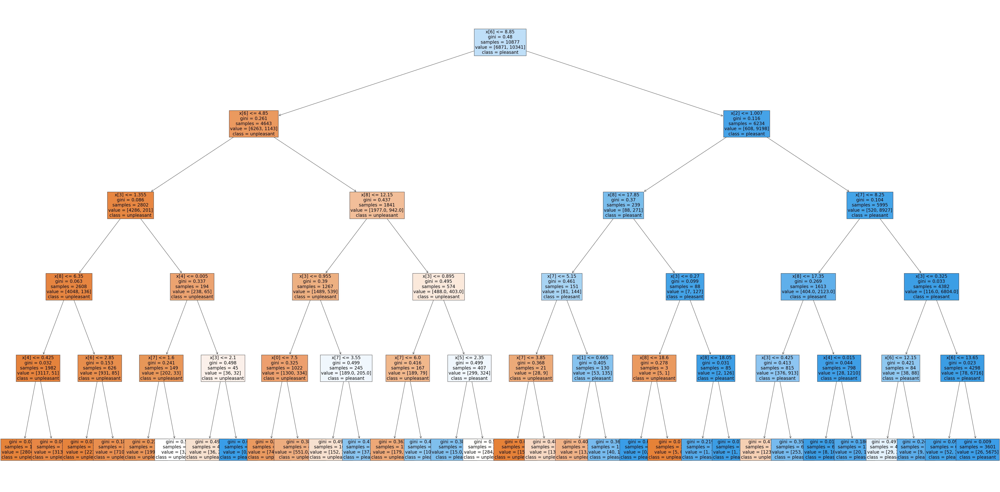

In [445]:
# Plot one tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[3], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True)

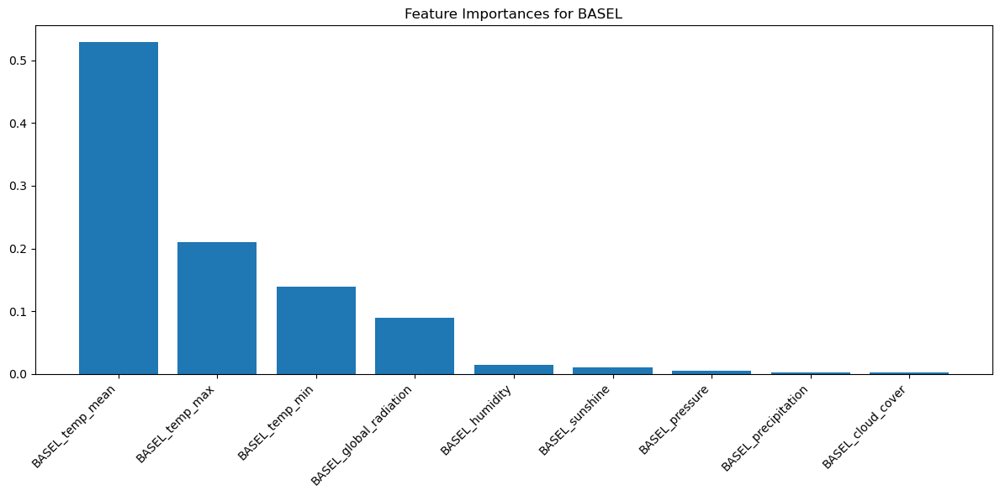

In [447]:
# Feature importance
importances = clf.feature_importances_
feature_names = basel.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(12, 6))
plt.title("Feature Importances for BASEL")
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=45, ha='right')
plt.tight_layout()
plt.show()

## MunchenB RF

In [256]:
# Create a subset of the full data with observations only from MunchenB station
munch = df[[col for col in df.columns if 'MUNCHENB_' in col]]

In [371]:
munch

,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,MUNCHENB_pressure
0,5,0.67,0.20,0.10,0.0,6.9,1.1,10.4,1.0304
1,6,0.72,0.61,0.30,5.1,6.2,4.2,10.2,1.0292
2,6,0.91,0.20,0.30,0.0,5.8,4.0,8.0,1.0320
3,6,0.90,0.20,0.01,0.0,3.9,3.2,5.4,1.0443
4,5,0.85,0.65,0.96,5.6,1.8,-3.0,6.0,1.0430
...,...,...,...,...,...,...,...,...,...
22945,2,0.76,1.37,0.26,9.7,14.3,8.3,22.2,1.0263
22946,6,0.70,1.37,0.26,7.7,16.1,8.9,26.1,1.0263
22947,7,0.64,1.37,0.26,6.8,17.4,11.2,26.2,1.0263
22948,6,0.75,1.37,0.26,8.3,14.5,9.2,23.5,1.0263


In [419]:
y = df_test.drop(columns=['DATE'], errors='ignore')
y = np.array(y) 
y = y.max(axis=1)

In [417]:
X = np.array(munch)

In [421]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [423]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [425]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 10, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, n_estimators=10)

In [427]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9022307424189613


[Text(0.5, 0.9166666666666666, 'x[2] <= 0.965\ngini = 0.479\nsamples = 10882\nvalue = [6825.0, 10387.0]\nclass = pleasant'),
 Text(0.25, 0.75, 'x[5] <= 7.45\ngini = 0.387\nsamples = 4690\nvalue = [5462.0, 1943.0]\nclass = unpleasant'),
 Text(0.125, 0.5833333333333334, 'x[6] <= -0.05\ngini = 0.192\nsamples = 3520\nvalue = [4995, 601]\nclass = unpleasant'),
 Text(0.0625, 0.4166666666666667, 'x[5] <= 2.75\ngini = 0.05\nsamples = 2113\nvalue = [3249, 85]\nclass = unpleasant'),
 Text(0.03125, 0.25, 'x[3] <= 3.505\ngini = 0.029\nsamples = 1868\nvalue = [2902, 44]\nclass = unpleasant'),
 Text(0.015625, 0.08333333333333333, 'gini = 0.029\nsamples = 1867\nvalue = [2902, 43]\nclass = unpleasant'),
 Text(0.046875, 0.08333333333333333, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = pleasant'),
 Text(0.09375, 0.25, 'x[1] <= 0.98\ngini = 0.189\nsamples = 245\nvalue = [347, 41]\nclass = unpleasant'),
 Text(0.078125, 0.08333333333333333, 'gini = 0.182\nsamples = 244\nvalue = [347, 39]\nclass = unpl

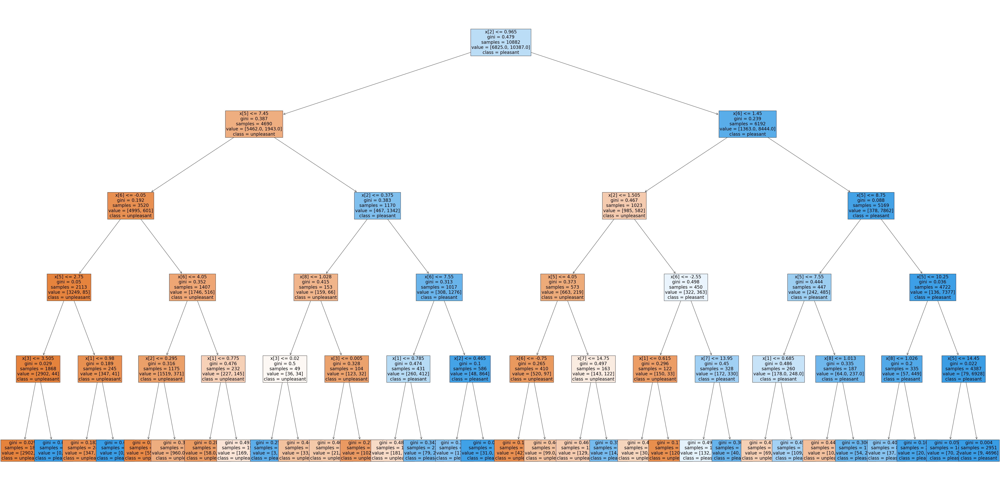

In [429]:
# Plot one tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[3], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True)

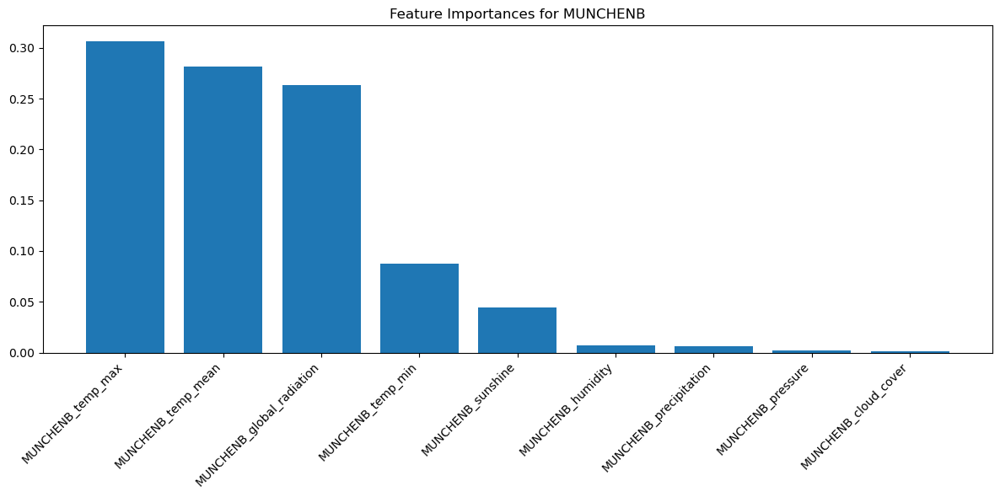

In [431]:
# Feature importance
importances = clf.feature_importances_
feature_names = munch.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(12, 6))
plt.title("Feature Importances for MUNCHENB")
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Maastricht RF

In [279]:
# Create a subset of the full data with observations only from Maastricht station
mast = df[[col for col in df.columns if 'MAASTRICHT_' in col]]

In [389]:
mast

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9
3,7,0.89,1.0277,0.16,0.00,0.3,7.0,3.0,10.0
4,7,0.92,1.0259,0.12,0.56,0.0,8.1,2.5,11.1
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.0201,1.17,0.20,5.3,18.6,14.1,22.6
22946,7,0.70,1.0190,1.17,0.20,5.0,18.9,15.8,23.5
22947,8,0.69,1.0183,1.17,0.20,3.2,18.2,13.7,24.3
22948,8,0.73,1.0181,1.17,0.20,6.8,16.3,12.8,21.4


In [391]:
y = df_test.drop(columns=['DATE'], errors='ignore')
y = np.array(y) 
y = y.max(axis=1)

In [393]:
X = np.array(mast)

In [395]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [397]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [409]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5)

In [411]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.8936911815963751


[Text(0.5, 0.9166666666666666, 'x[8] <= 12.95\ngini = 0.479\nsamples = 10893\nvalue = [6857, 10355]\nclass = pleasant'),
 Text(0.25, 0.75, 'x[3] <= 0.605\ngini = 0.301\nsamples = 4859\nvalue = [6258, 1420]\nclass = unpleasant'),
 Text(0.125, 0.5833333333333334, 'x[4] <= 0.505\ngini = 0.195\nsamples = 3276\nvalue = [4606, 566]\nclass = unpleasant'),
 Text(0.0625, 0.4166666666666667, 'x[6] <= 8.65\ngini = 0.156\nsamples = 2670\nvalue = [3850, 358]\nclass = unpleasant'),
 Text(0.03125, 0.25, 'x[5] <= 0.55\ngini = 0.106\nsamples = 2381\nvalue = [3542, 211]\nclass = unpleasant'),
 Text(0.015625, 0.08333333333333333, 'gini = 0.138\nsamples = 1347\nvalue = [1968, 159]\nclass = unpleasant'),
 Text(0.046875, 0.08333333333333333, 'gini = 0.062\nsamples = 1034\nvalue = [1574.0, 52.0]\nclass = unpleasant'),
 Text(0.09375, 0.25, 'x[1] <= 0.985\ngini = 0.437\nsamples = 289\nvalue = [308, 147]\nclass = unpleasant'),
 Text(0.078125, 0.08333333333333333, 'gini = 0.429\nsamples = 283\nvalue = [308, 139]

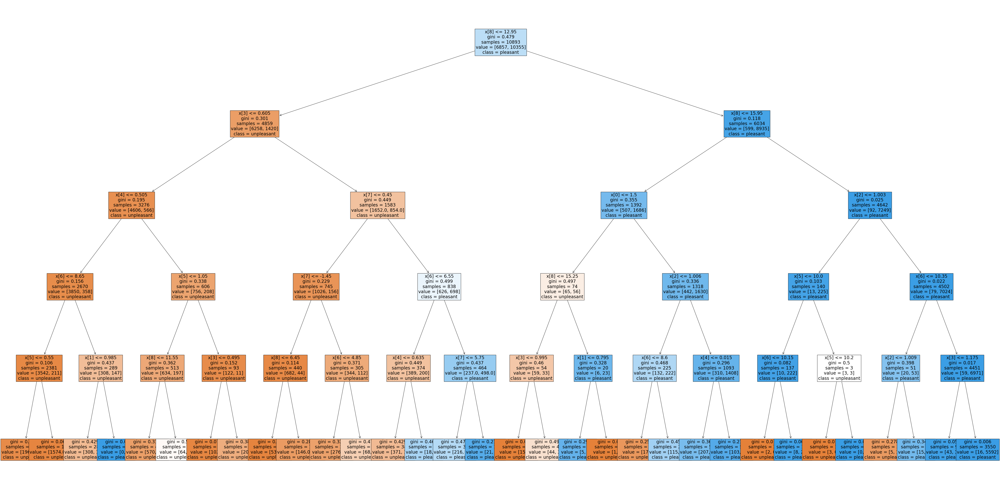

In [413]:
# Plot one tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[3], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True)

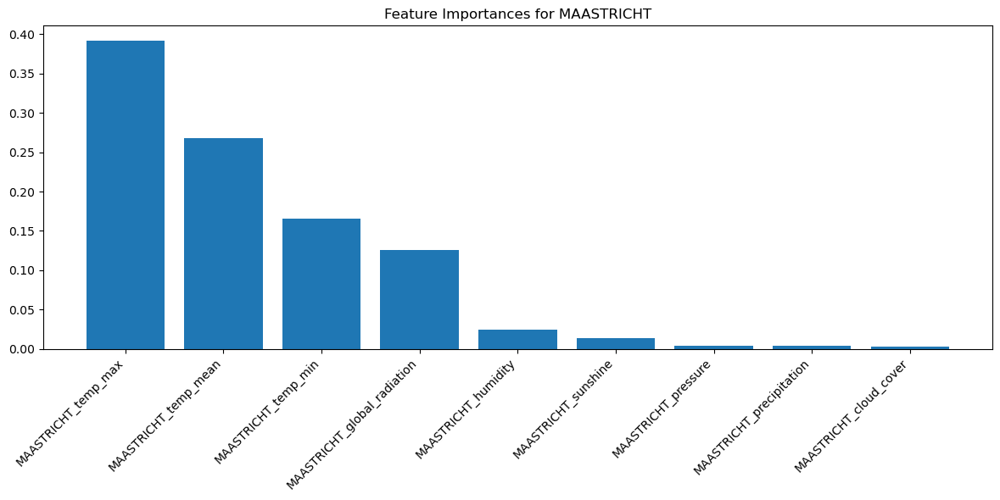

In [415]:
# Feature importance
importances = clf.feature_importances_
feature_names = mast.columns

# Sort by importance
indices = np.argsort(importances)[::-1]

# Plot
plt.figure(figsize=(12, 6))
plt.title("Feature Importances for MAASTRICHT")
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=45, ha='right')
plt.tight_layout()
plt.show()